# Notebook initiation
1.   Mounting drive
2.   Installing plotly
3.   Importing libraries

In [3]:
import plotly.graph_objects as go
import plotly.express as px
import os
import numpy as np
import pandas as pd    
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

In [4]:
import openslide

def get_properties(wsi_file_path):

    wsi = openslide.open_slide(wsi_file_path)
    wsi_properties = wsi.properties
    x_mpp = wsi_properties[openslide.PROPERTY_NAME_MPP_X]
    y_mpp = wsi_properties[openslide.PROPERTY_NAME_MPP_Y]
    width, height = wsi_properties["openslide.level[0].width"], wsi_properties["openslide.level[0].height"]
    print(x_mpp, y_mpp, width, height)

    return x_mpp, y_mpp, width, height

# Defining input wsi path and dataframes path

In [5]:
wsi_file_path = "/home/SSD/Atishay/Data/WSI/C3L-01663-21.svs"
x_mpp, y_mpp, width, height = get_properties(wsi_file_path)
x_mpp, y_mpp = float(x_mpp), float(y_mpp)
width, height = int(width), int(height)

0.49419999999999997 0.49419999999999997 13943 14869


In [12]:
dataframes_path = "/home/SSD/Atishay/Output/wsi_pannuke_output/C3L-01663-21/wsi_info"

# Pie chart

## Defining functions

In [27]:
def pie_chart(dataframes_path):

    Neoplastic_df_path = os.path.join(dataframes_path, "Neoplastic_df.csv")
    Neoplastic_df = pd.read_csv(Neoplastic_df_path)
    
    Inflammatory_df_path = os.path.join(dataframes_path, "Inflammatory_df.csv")
    Inflammatory_df = pd.read_csv(Inflammatory_df_path)
    
    Connective_df_path = os.path.join(dataframes_path, "Connective_df.csv")
    Connective_df = pd.read_csv(Connective_df_path)
    
    Dead_df_path = os.path.join(dataframes_path, "Dead_df.csv")
    Dead_df = pd.read_csv(Dead_df_path)
    
    Non_Neo_Epithelial_df_path = os.path.join(dataframes_path, "Non_Neo_Epithelial_df.csv")
    Non_Neo_Epithelial_df = pd.read_csv(Non_Neo_Epithelial_df_path)

    n_Neoplastic = len(Neoplastic_df)
    n_Inflammatory = len(Inflammatory_df)
    n_Connective = len(Connective_df)
    n_Dead = len(Dead_df)
    n_Non_Neo_Epithelial = len(Non_Neo_Epithelial_df)

    labels = ['Neoplastic','Inflammatory','Connective','Dead', 'Non Neo Epithelial']
    values = [n_Neoplastic, n_Inflammatory, n_Connective, n_Dead, n_Non_Neo_Epithelial]

    mrg = dict(l = 50, r = 50, b = 50, t = 50, pad = 100)

    fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+value+percent', title="Pie chart representing the proportion and number of different types of nuclei")])

    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=20, t=20, b=20), paper_bgcolor="LightGreen")

    fig.show()

## Visualizing

In [28]:
pie_chart(dataframes_path)

# Scatter size plot

## Defining functions

In [15]:
def scatter_Neoplastic_size(dataframes_path):

    Neoplastic_df_path = os.path.join(dataframes_path, "Neoplastic_df.csv")
    Neoplastic_df = pd.read_csv(Neoplastic_df_path)
    Neoplastic_df["width"] = Neoplastic_df["width"]*x_mpp
    Neoplastic_df["height"] = Neoplastic_df["height"]*y_mpp
    Neoplastic_df["width_height"] = Neoplastic_df["width"] * Neoplastic_df["height"]

    fig = px.scatter(Neoplastic_df, x="width", y="height", color="width_height", marginal_y="violin",
           marginal_x="box", trendline="ols", labels={
                     "width": "Neoplastic nuclei width (microns)",
                     "height": "Neoplastic nuclei height (microns)",
                     "width_height": "w * h"
                 }, title="Height vs width plot of Neoplastic nuclei (microns)", width=1600, height=700)
    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")
    fig.show()

In [16]:
def scatter_Inflammatory_size(dataframes_path):

    Inflammatory_df_path = os.path.join(dataframes_path, "Inflammatory_df.csv")
    Inflammatory_df = pd.read_csv(Inflammatory_df_path)
    Inflammatory_df["width"] = Inflammatory_df["width"]*x_mpp
    Inflammatory_df["height"] = Inflammatory_df["height"]*y_mpp
    Inflammatory_df["width_height"] = Inflammatory_df["width"] * Inflammatory_df["height"]

    fig = px.scatter(Inflammatory_df, x="width", y="height", color="width_height", marginal_y="violin",
           marginal_x="box", trendline="ols", labels={
                     "width": "Inflammatory nuclei width (microns)",
                     "height": "Inflammatory nuclei height (microns)",
                     "width_height": "w * h"
                 }, title="Height vs width plot of Inflammatory nuclei (microns)", width=1600, height=700)
    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")
    fig.show()

In [17]:
def scatter_Connective_size(dataframes_path):

    Connective_df_path = os.path.join(dataframes_path, "Connective_df.csv")
    Connective_df = pd.read_csv(Connective_df_path)
    Connective_df["width"] = Connective_df["width"]*x_mpp
    Connective_df["height"] = Connective_df["height"]*y_mpp
    Connective_df["width_height"] = Connective_df["width"] * Connective_df["height"]

    fig = px.scatter(Connective_df, x="width", y="height", color="width_height", marginal_y="violin",
           marginal_x="box", trendline="ols", labels={
                     "width": "Connective nuclei width (microns)",
                     "height": "Connective nuclei height (microns)",
                     "width_height": "w * h"
                 }, title="Height vs width plot of Connective nuclei (microns)", width=1600, height=700)
    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")
    fig.show()

In [18]:
def scatter_Dead_size(dataframes_path):

    Dead_df_path = os.path.join(dataframes_path, "Dead_df.csv")
    Dead_df = pd.read_csv(Dead_df_path)
    Dead_df["width"] = Dead_df["width"]*x_mpp
    Dead_df["height"] = Dead_df["height"]*y_mpp
    Dead_df["width_height"] = Dead_df["width"] * Dead_df["height"]

    fig = px.scatter(Dead_df, x="width", y="height", color="width_height", marginal_y="violin",
           marginal_x="box", trendline="ols", labels={
                     "width": "Dead nuclei width (microns)",
                     "height": "Dead nuclei height (microns)",
                     "width_height": "w * h"
                 }, title="Height vs width plot of Dead nuclei (microns)", width=1600, height=700)
    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")
    fig.show()

In [29]:
def scatter_Non_Neo_Epithelial_size(dataframes_path):

    Non_Neo_Epithelial_df_path = os.path.join(dataframes_path, "Non_Neo_Epithelial_df.csv")
    Non_Neo_Epithelial_df = pd.read_csv(Non_Neo_Epithelial_df_path)
    Non_Neo_Epithelial_df["width"] = Non_Neo_Epithelial_df["width"]*x_mpp
    Non_Neo_Epithelial_df["height"] = Non_Neo_Epithelial_df["height"]*y_mpp
    Non_Neo_Epithelial_df["width_height"] = Non_Neo_Epithelial_df["width"] * Non_Neo_Epithelial_df["height"]

    fig = px.scatter(Non_Neo_Epithelial_df, x="width", y="height", color="width_height", marginal_y="violin",
           marginal_x="box", trendline="ols", labels={
                     "width": "Non_Neo_Epithelial nuclei width (microns)",
                     "height": "Non_Neo_Epithelial nuclei height (microns)",
                     "width_height": "w * h"
                 }, title="Height vs width plot of Non_Neo_Epithelial nuclei (microns)", width=1600, height=700)
    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")
    fig.show()

## Visualizing

In [19]:
scatter_Neoplastic_size(dataframes_path)

In [20]:
scatter_Inflammatory_size(dataframes_path)

In [21]:
scatter_Connective_size(dataframes_path)

In [22]:
scatter_Dead_size(dataframes_path)

In [30]:
scatter_Non_Neo_Epithelial_size(dataframes_path)

# Size Box plot

## Defining functions 

In [31]:
def box_plot_width(dataframes_path):

    Neoplastic_df_path = os.path.join(dataframes_path, "Neoplastic_df.csv")
    Neoplastic_df = pd.read_csv(Neoplastic_df_path)
    Neoplastic_df["width"] = np.log10(Neoplastic_df["width"]*x_mpp)
    Neoplastic_df["height"] = np.log10(Neoplastic_df["height"]*y_mpp)
    Neoplastic_df["type"] = "Neoplastic"

    Connective_df_path = os.path.join(dataframes_path, "Connective_df.csv")
    Connective_df = pd.read_csv(Connective_df_path)
    Connective_df["width"] = np.log10(Connective_df["width"]*x_mpp)
    Connective_df["height"] = np.log10(Connective_df["height"]*y_mpp)
    Connective_df["type"] = "Connective"

    Dead_df_path = os.path.join(dataframes_path, "Dead_df.csv")
    Dead_df = pd.read_csv(Dead_df_path)
    Dead_df["width"] = np.log10(Dead_df["width"]*x_mpp)
    Dead_df["height"] = np.log10(Dead_df["height"]*y_mpp)
    Dead_df["type"] = "Dead"

    Inflammatory_df_path = os.path.join(dataframes_path, "Inflammatory_df.csv")
    Inflammatory_df = pd.read_csv(Inflammatory_df_path)
    Inflammatory_df["width"] = np.log10(Inflammatory_df["width"]*x_mpp)
    Inflammatory_df["height"] = np.log10(Inflammatory_df["height"]*y_mpp)
    Inflammatory_df["type"] = "Inflammatory"

    Non_Neo_Epithelial_df_path = os.path.join(dataframes_path, "Non_Neo_Epithelial_df.csv")
    Non_Neo_Epithelial_df = pd.read_csv(Non_Neo_Epithelial_df_path)
    Non_Neo_Epithelial_df["width"] = np.log10(Non_Neo_Epithelial_df["width"]*x_mpp)
    Non_Neo_Epithelial_df["height"] = np.log10(Non_Neo_Epithelial_df["height"]*y_mpp)
    Non_Neo_Epithelial_df["type"] = "Non_Neo_Epithelial"

    frames = [Neoplastic_df, Connective_df, Dead_df, Inflammatory_df, Non_Neo_Epithelial_df]
    df_all = pd.concat(frames)

    fig = px.box(df_all, x="type", y="width", color="type", points="all", labels={
                     "width": "log10(width) (microns)"}, title="Box plot of nuclei width in microns", width=1600, height=700)
    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    fig.show()

In [32]:
def box_plot_height(dataframes_path):

    Neoplastic_df_path = os.path.join(dataframes_path, "Neoplastic_df.csv")
    Neoplastic_df = pd.read_csv(Neoplastic_df_path)
    Neoplastic_df["width"] = np.log10(Neoplastic_df["width"]*x_mpp)
    Neoplastic_df["height"] = np.log10(Neoplastic_df["height"]*y_mpp)
    Neoplastic_df["type"] = "Neoplastic"

    Connective_df_path = os.path.join(dataframes_path, "Connective_df.csv")
    Connective_df = pd.read_csv(Connective_df_path)
    Connective_df["width"] = np.log10(Connective_df["width"]*x_mpp)
    Connective_df["height"] = np.log10(Connective_df["height"]*y_mpp)
    Connective_df["type"] = "Connective"

    Dead_df_path = os.path.join(dataframes_path, "Dead_df.csv")
    Dead_df = pd.read_csv(Dead_df_path)
    Dead_df["width"] = np.log10(Dead_df["width"]*x_mpp)
    Dead_df["height"] = np.log10(Dead_df["height"]*y_mpp)
    Dead_df["type"] = "Dead"

    Inflammatory_df_path = os.path.join(dataframes_path, "Inflammatory_df.csv")
    Inflammatory_df = pd.read_csv(Inflammatory_df_path)
    Inflammatory_df["width"] = np.log10(Inflammatory_df["width"]*x_mpp)
    Inflammatory_df["height"] = np.log10(Inflammatory_df["height"]*y_mpp)
    Inflammatory_df["type"] = "Inflammatory"

    Non_Neo_Epithelial_df_path = os.path.join(dataframes_path, "Non_Neo_Epithelial_df.csv")
    Non_Neo_Epithelial_df = pd.read_csv(Non_Neo_Epithelial_df_path)
    Non_Neo_Epithelial_df["width"] = np.log10(Non_Neo_Epithelial_df["width"]*x_mpp)
    Non_Neo_Epithelial_df["height"] = np.log10(Non_Neo_Epithelial_df["height"]*y_mpp)
    Non_Neo_Epithelial_df["type"] = "Non_Neo_Epithelial"

    frames = [Neoplastic_df, Connective_df, Dead_df, Inflammatory_df, Non_Neo_Epithelial_df]
    df_all = pd.concat(frames)

    fig = px.box(df_all, x="type", y="height", color="type", points="all", labels={
                     "height": "log10(height) (microns)"
                 }, title="Box plot of nuclei height in microns", width=1600, height=700)
    fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="red", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    fig.show()

## Visualizing

In [33]:
box_plot_width(dataframes_path)

In [35]:
box_plot_height(dataframes_path)

# Distribution Scatter Plot 

## Defining functions

In [36]:
def scatter_distribution(dataframes_path, width, height):

    Neoplastic_df_path = os.path.join(dataframes_path, "Neoplastic_df.csv")
    Neoplastic_df = pd.read_csv(Neoplastic_df_path)
    Neoplastic_df["width"] = np.log10(Neoplastic_df["width"]*x_mpp)
    Neoplastic_df["height"] = np.log10(Neoplastic_df["height"]*y_mpp)
    Neoplastic_df["type"] = "Neoplastic"
    centroid_Neoplastic = Neoplastic_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Neoplastic)):
        x_coord.append(float(centroid_Neoplastic[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Neoplastic[idx].split(",")[1].split("]")[0]))
    Neoplastic_df["x_coord"] = x_coord
    Neoplastic_df["y_coord"] = y_coord
    Neoplastic_df["area"] = Neoplastic_df["width"] * Neoplastic_df["height"]
    

    Connective_df_path = os.path.join(dataframes_path, "Connective_df.csv")
    Connective_df = pd.read_csv(Connective_df_path)
    Connective_df["width"] = np.log10(Connective_df["width"]*x_mpp)
    Connective_df["height"] = np.log10(Connective_df["height"]*y_mpp)
    Connective_df["type"] = "Connective"
    centroid_Connective = Connective_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Connective)):
        x_coord.append(float(centroid_Connective[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Connective[idx].split(",")[1].split("]")[0]))
    Connective_df["x_coord"] = x_coord
    Connective_df["y_coord"] = y_coord
    Connective_df["area"] = Connective_df["width"] * Connective_df["height"]

    Dead_df_path = os.path.join(dataframes_path, "Dead_df.csv")
    Dead_df = pd.read_csv(Dead_df_path)
    Dead_df["width"] = np.log10(Dead_df["width"]*x_mpp)
    Dead_df["height"] = np.log10(Dead_df["height"]*y_mpp)
    Dead_df["type"] = "Dead"
    centroid_Dead = Dead_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Dead)):
        x_coord.append(float(centroid_Dead[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Dead[idx].split(",")[1].split("]")[0]))
    Dead_df["x_coord"] = x_coord
    Dead_df["y_coord"] = y_coord
    Dead_df["area"] = Dead_df["width"] * Dead_df["height"]

    Inflammatory_df_path = os.path.join(dataframes_path, "Inflammatory_df.csv")
    Inflammatory_df = pd.read_csv(Inflammatory_df_path)
    Inflammatory_df["width"] = np.log10(Inflammatory_df["width"]*x_mpp)
    Inflammatory_df["height"] = np.log10(Inflammatory_df["height"]*y_mpp)
    Inflammatory_df["type"] = "Inflammatory"
    centroid_Inflammatory = Inflammatory_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Inflammatory)):
        x_coord.append(float(centroid_Inflammatory[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Inflammatory[idx].split(",")[1].split("]")[0]))
    Inflammatory_df["x_coord"] = x_coord
    Inflammatory_df["y_coord"] = y_coord
    Inflammatory_df["area"] = Inflammatory_df["width"] * Inflammatory_df["height"]

    Non_Neo_Epithelial_df_path = os.path.join(dataframes_path, "Non_Neo_Epithelial_df.csv")
    Non_Neo_Epithelial_df = pd.read_csv(Non_Neo_Epithelial_df_path)
    Non_Neo_Epithelial_df["width"] = np.log10(Non_Neo_Epithelial_df["width"]*x_mpp)
    Non_Neo_Epithelial_df["height"] = np.log10(Non_Neo_Epithelial_df["height"]*y_mpp)
    Non_Neo_Epithelial_df["type"] = "Non_Neo_Epithelial"
    centroid_Non_Neo_Epithelial = Non_Neo_Epithelial_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Non_Neo_Epithelial)):
        x_coord.append(float(centroid_Non_Neo_Epithelial[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Non_Neo_Epithelial[idx].split(",")[1].split("]")[0]))
    Non_Neo_Epithelial_df["x_coord"] = x_coord
    Non_Neo_Epithelial_df["y_coord"] = y_coord
    Non_Neo_Epithelial_df["area"] = Non_Neo_Epithelial_df["width"] * Non_Neo_Epithelial_df["height"]

    frames = [Neoplastic_df, Connective_df, Dead_df, Inflammatory_df, Non_Neo_Epithelial_df]
    df_all = pd.concat(frames)

    max_ = max(width, height)
    scale = max_/20
    if(max_ == width):
        width = 20
        height = height/scale
    elif(max_ == height):
        height = 20
        width = width/scale
    fig, ax = plt.subplots(figsize=(width,height))
    # for color in ['tab:blue', 'tab:orange', 'tab:green']:
    #     n = 750
    #     x, y = np.random.rand(2, n)
    #     scale = 200.0 * np.random.rand(n)
    scatter = ax.scatter(Neoplastic_df["x_coord"], Neoplastic_df["y_coord"], s=Neoplastic_df["area"]*100, c="red", alpha=0.5, label=Neoplastic_df["type"][0])
    scatter = ax.scatter(Dead_df["x_coord"], Dead_df["y_coord"], s=Dead_df["area"]*100, c="green", alpha=0.5, label=Dead_df["type"][0])
    scatter = ax.scatter(Connective_df["x_coord"], Connective_df["y_coord"], s=Connective_df["area"]*100, c="blue", alpha=0.5, label=Connective_df["type"][0])
    scatter = ax.scatter(Inflammatory_df["x_coord"], Inflammatory_df["y_coord"], s=Inflammatory_df["area"]*100, c="yellow", alpha=0.5, label=Inflammatory_df["type"][0])
    scatter = ax.scatter(Non_Neo_Epithelial_df["x_coord"], Non_Neo_Epithelial_df["y_coord"], s=Non_Neo_Epithelial_df["area"]*100, c="yellow", alpha=0.5, label=Non_Neo_Epithelial_df["type"][0])

    # ax.scatter(x, y, c=color, s=scale, label=color,
    #         alpha=0.3, edgecolors='none')

    ax.legend()
    ax.grid(True)

    plt.xlabel("X coordinates", fontsize=30)
    plt.ylabel("Y coordinates", fontsize=30)
    plt.title(label="Spatial Nuclei Distribution", fontsize=30)

    plt.show()

    # Plotly Code :- 
    # fig = px.scatter(df_all, x="x_coord", y="y_coord", color="type",
    #              size='area', hover_data=['centroid'], title="Nuclei Distribution", width = 2200, height = 1000)
    # print(np.max(x_coord), np.max(y_coord))

    # fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="black", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    # fig.show()

In [37]:
def scatter_distribution_Neoplastic(dataframes_path, width, height):

    Neoplastic_df_path = os.path.join(dataframes_path, "Neoplastic_df.csv")
    Neoplastic_df = pd.read_csv(Neoplastic_df_path)
    Neoplastic_df["width"] = np.log10(Neoplastic_df["width"]*x_mpp)
    Neoplastic_df["height"] = np.log10(Neoplastic_df["height"]*y_mpp)
    Neoplastic_df["type"] = "Neoplastic"
    centroid_Neoplastic = Neoplastic_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Neoplastic)):
        x_coord.append(float(centroid_Neoplastic[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Neoplastic[idx].split(",")[1].split("]")[0]))
    Neoplastic_df["x_coord"] = x_coord
    Neoplastic_df["y_coord"] = y_coord
    Neoplastic_df["area"] = Neoplastic_df["width"] * Neoplastic_df["height"]

    max_ = max(width, height)
    scale = max_/20
    if(max_ == width):
        width = 20
        height = height/scale
    elif(max_ == height):
        height = 20
        width = width/scale
    fig, ax = plt.subplots(figsize=(width,height))

    scatter = ax.scatter(Neoplastic_df["x_coord"], Neoplastic_df["y_coord"], s=Neoplastic_df["area"]*100, c=Neoplastic_df["area"], alpha=0.5, cmap="Spectral")
    
    plt.xlabel("X coordinates", fontsize=30)
    plt.ylabel("Y coordinates", fontsize=30)
    plt.title(label="Neoplastic Nuclei Distribution", fontsize=30)

    plt.show()

    # Plotly Code :- 

    # fig = px.scatter(Neoplastic_df, x="x_coord", y="y_coord", color="area",
    #              size='area', hover_data=['centroid'], title="Neoplastic Nuclei Distribution", width = np.max(x_coord), height = np.max(y_coord))
    # print(np.max(x_coord), np.max(y_coord))

    # fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="black", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    # fig.show()

In [38]:
def scatter_distribution_Connective(dataframes_path, width, height):

    Connective_df_path = os.path.join(dataframes_path, "Connective_df.csv")
    Connective_df = pd.read_csv(Connective_df_path)
    Connective_df["width"] = np.log10(Connective_df["width"]*x_mpp)
    Connective_df["height"] = np.log10(Connective_df["height"]*y_mpp)
    Connective_df["type"] = "Connective"
    centroid_Connective = Connective_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Connective)):
        x_coord.append(float(centroid_Connective[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Connective[idx].split(",")[1].split("]")[0]))
    Connective_df["x_coord"] = x_coord
    Connective_df["y_coord"] = y_coord
    Connective_df["area"] = Connective_df["width"] * Connective_df["height"]

    max_ = max(width, height)
    scale = max_/20
    if(max_ == width):
        width = 20
        height = height/scale
    elif(max_ == height):
        height = 20
        width = width/scale
    fig, ax = plt.subplots(figsize=(width,height))

    scatter = ax.scatter(Connective_df["x_coord"], Connective_df["y_coord"], s=Connective_df["area"]*100, c=Connective_df["area"], alpha=0.5, cmap="Spectral")
    
    plt.xlabel("X coordinates", fontsize=30)
    plt.ylabel("Y coordinates", fontsize=30)
    plt.title(label="Connective Nuclei Distribution", fontsize=30)

    plt.show()

    # Plotly Code :- 
    # fig = px.scatter(Connective_df, x="x_coord", y="y_coord", color="area",
    #              size='area', hover_data=['centroid'], title="Connective Nuclei Distribution", width = 2200, height = 1000)

    # fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="black", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    # fig.show()

In [39]:
def scatter_distribution_Dead(dataframes_path, width, height):

    Dead_df_path = os.path.join(dataframes_path, "Dead_df.csv")
    Dead_df = pd.read_csv(Dead_df_path)
    Dead_df["width"] = np.log10(Dead_df["width"]*x_mpp)
    Dead_df["height"] = np.log10(Dead_df["height"]*y_mpp)
    Dead_df["type"] = "Dead"
    centroid_Dead = Dead_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Dead)):
        x_coord.append(float(centroid_Dead[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Dead[idx].split(",")[1].split("]")[0]))
    Dead_df["x_coord"] = x_coord
    Dead_df["y_coord"] = y_coord
    Dead_df["area"] = Dead_df["width"] * Dead_df["height"]

    max_ = max(width, height)
    scale = max_/20
    if(max_ == width):
        width = 20
        height = height/scale
    elif(max_ == height):
        height = 20
        width = width/scale
    fig, ax = plt.subplots(figsize=(width,height))

    scatter = ax.scatter(Dead_df["x_coord"], Dead_df["y_coord"], s=Dead_df["area"]*100, c=Dead_df["area"], alpha=0.5, cmap="Spectral")
    
    plt.xlabel("X coordinates", fontsize=30)
    plt.ylabel("Y coordinates", fontsize=30)
    plt.title(label="Dead Nuclei Distribution", fontsize=30)

    plt.show()

    # Plotly Code :- 
    # fig = px.scatter(Dead_df, x="x_coord", y="y_coord", color="area",
    #              size='area', hover_data=['centroid'], title="Dead Nuclei Distribution", width = 2200, height = 1000)

    # fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="black", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    # fig.show()

In [40]:
def scatter_distribution_Inflammatory(dataframes_path, width, height):

    Inflammatory_df_path = os.path.join(dataframes_path, "Inflammatory_df.csv")
    Inflammatory_df = pd.read_csv(Inflammatory_df_path)
    Inflammatory_df["width"] = np.log10(Inflammatory_df["width"]*x_mpp)
    Inflammatory_df["height"] = np.log10(Inflammatory_df["height"]*y_mpp)
    Inflammatory_df["type"] = "Inflammatory"
    centroid_Inflammatory = Inflammatory_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Inflammatory)):
        x_coord.append(float(centroid_Inflammatory[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Inflammatory[idx].split(",")[1].split("]")[0]))
    Inflammatory_df["x_coord"] = x_coord
    Inflammatory_df["y_coord"] = y_coord
    Inflammatory_df["area"] = Inflammatory_df["width"] * Inflammatory_df["height"]

    max_ = max(width, height)
    scale = max_/20
    if(max_ == width):
        width = 20
        height = height/scale
    elif(max_ == height):
        height = 20
        width = width/scale
    fig, ax = plt.subplots(figsize=(width,height))

    scatter = ax.scatter(Inflammatory_df["x_coord"], Inflammatory_df["y_coord"], s=Inflammatory_df["area"]*100, c=Inflammatory_df["area"], alpha=0.5, cmap="Spectral")
    
    plt.xlabel("X coordinates", fontsize=30)
    plt.ylabel("Y coordinates", fontsize=30)
    plt.title(label="Inflammatory Nuclei Distribution", fontsize=30)

    plt.show()

    # Plotly Code :- 
    # fig = px.scatter(Inflammatory_df, x="x_coord", y="y_coord", color="area",
    #              size='area', hover_data=['centroid'], title="Inflammatory Nuclei Distribution", width = 2200, height = 1000)

    # fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="black", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    # fig.show()

In [41]:
def scatter_distribution_Non_Neo_Epithelial(dataframes_path, width, height):

    Non_Neo_Epithelial_df_path = os.path.join(dataframes_path, "Non_Neo_Epithelial_df.csv")
    Non_Neo_Epithelial_df = pd.read_csv(Non_Neo_Epithelial_df_path)
    Non_Neo_Epithelial_df["width"] = np.log10(Non_Neo_Epithelial_df["width"]*x_mpp)
    Non_Neo_Epithelial_df["height"] = np.log10(Non_Neo_Epithelial_df["height"]*y_mpp)
    Non_Neo_Epithelial_df["type"] = "Non_Neo_Epithelial"
    centroid_Non_Neo_Epithelial = Non_Neo_Epithelial_df["centroid"]
    x_coord = []
    y_coord = []
    for idx in range(0, len(centroid_Non_Neo_Epithelial)):
        x_coord.append(float(centroid_Non_Neo_Epithelial[idx].split(",")[0].split("[")[1]))
        y_coord.append(float(centroid_Non_Neo_Epithelial[idx].split(",")[1].split("]")[0]))
    Non_Neo_Epithelial_df["x_coord"] = x_coord
    Non_Neo_Epithelial_df["y_coord"] = y_coord
    Non_Neo_Epithelial_df["area"] = Non_Neo_Epithelial_df["width"] * Non_Neo_Epithelial_df["height"]

    max_ = max(width, height)
    scale = max_/20
    if(max_ == width):
        width = 20
        height = height/scale
    elif(max_ == height):
        height = 20
        width = width/scale
    fig, ax = plt.subplots(figsize=(width,height))

    scatter = ax.scatter(Non_Neo_Epithelial_df["x_coord"], Non_Neo_Epithelial_df["y_coord"], s=Non_Neo_Epithelial_df["area"]*100, c=Non_Neo_Epithelial_df["area"], alpha=0.5, cmap="Spectral")
    
    plt.xlabel("X coordinates", fontsize=30)
    plt.ylabel("Y coordinates", fontsize=30)
    plt.title(label="Non_Neo_Epithelial Nuclei Distribution", fontsize=30)

    plt.show()

    # Plotly Code :- 
    # fig = px.scatter(Non_Neo_Epithelial_df, x="x_coord", y="y_coord", color="area",
    #              size='area', hover_data=['centroid'], title="Non_Neo_Epithelial Nuclei Distribution", width = 2200, height = 1000)

    # fig.update_layout(font_size=18,font_family="Courier New",font_color="blue",title_font_family="Times New Roman",title_font_color="black", margin=dict(l=20, r=40, t=40, b=20), paper_bgcolor="LightSteelBlue")

    # fig.show()

## Visualizing

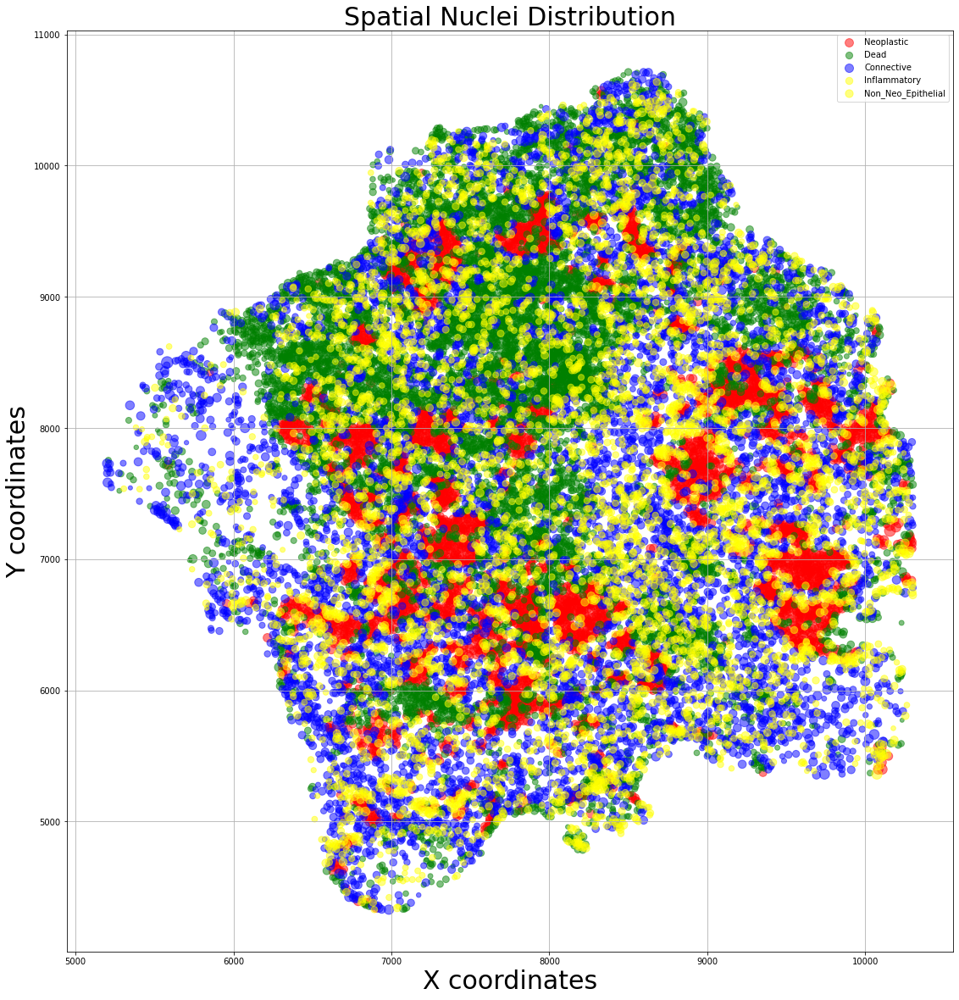

In [42]:
scatter_distribution(dataframes_path, width, height)

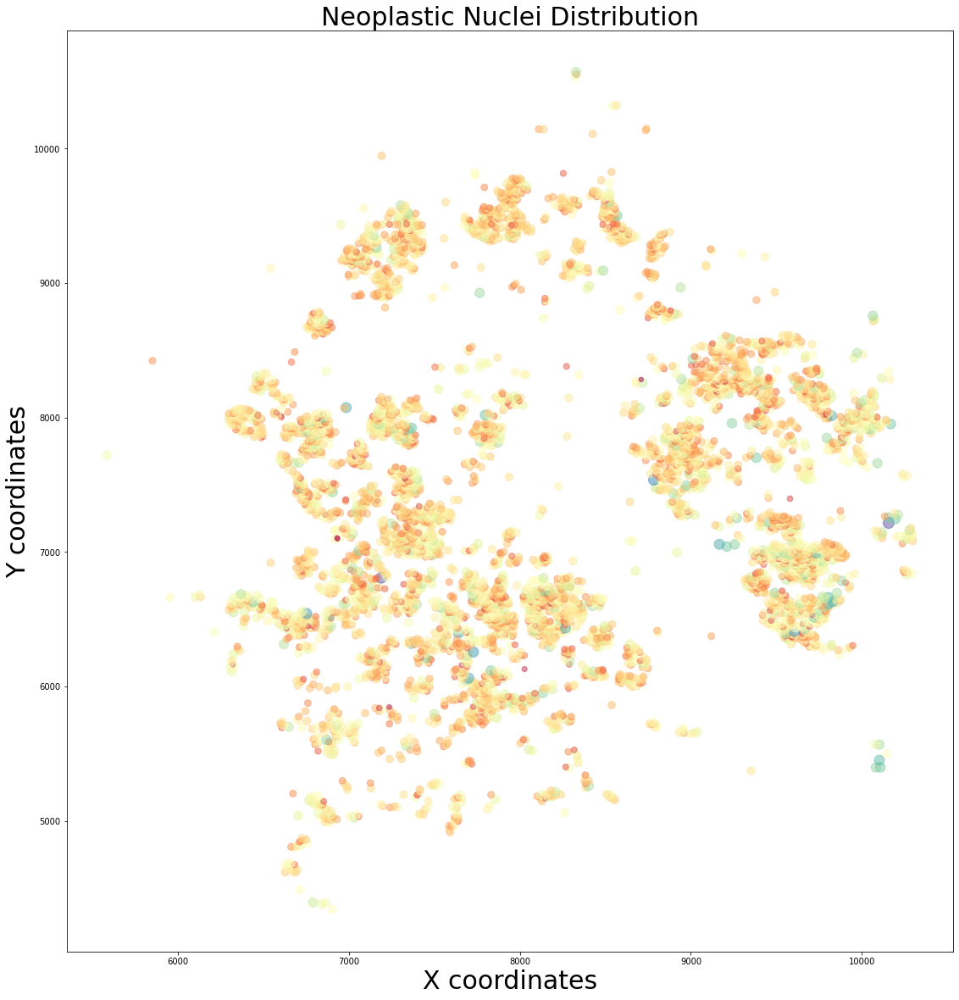

In [43]:
    scatter_distribution_Neoplastic(dataframes_path, width, height)

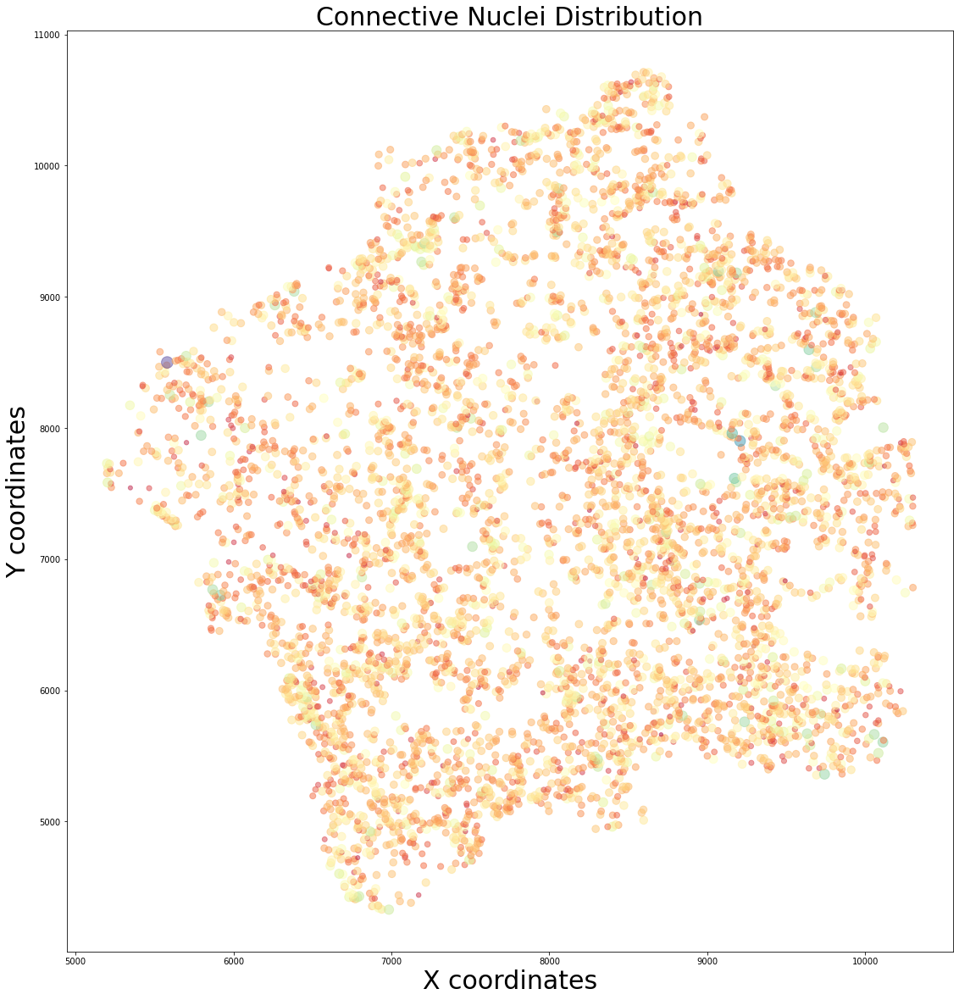

In [44]:
scatter_distribution_Connective(dataframes_path, width, height)

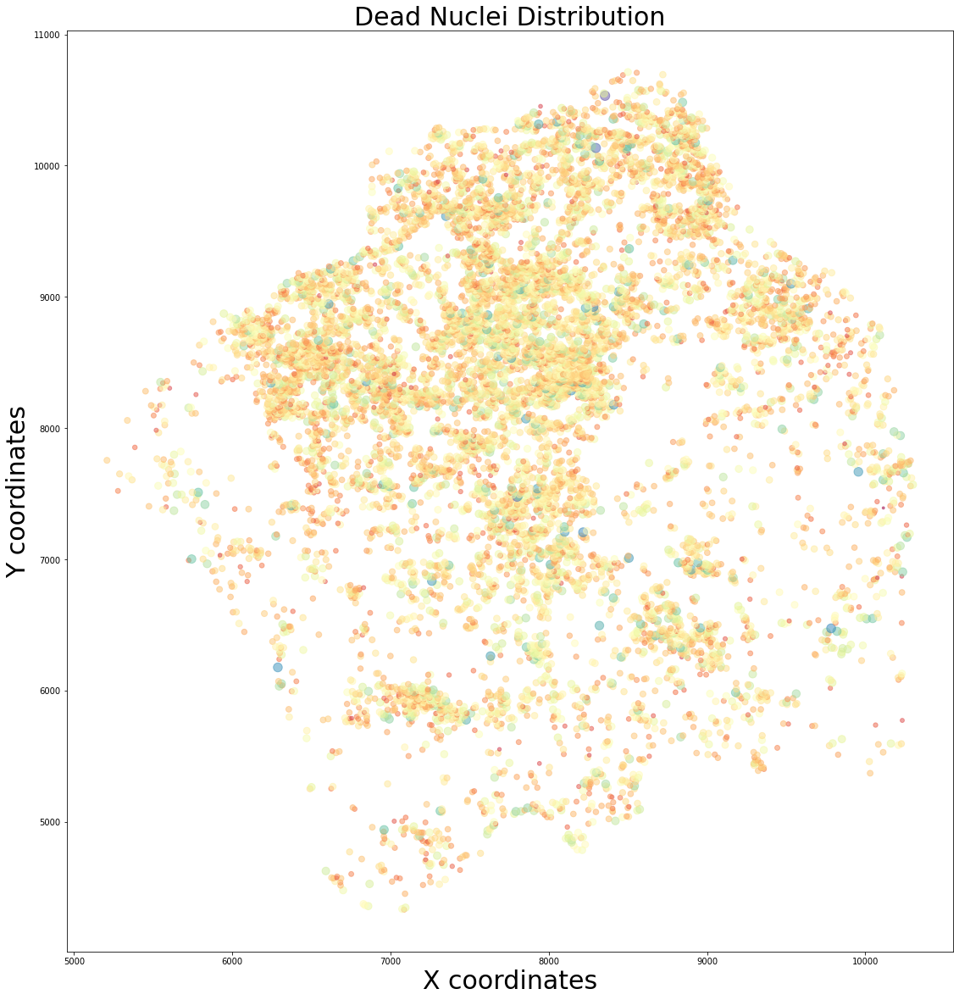

In [45]:
scatter_distribution_Dead(dataframes_path, width, height)

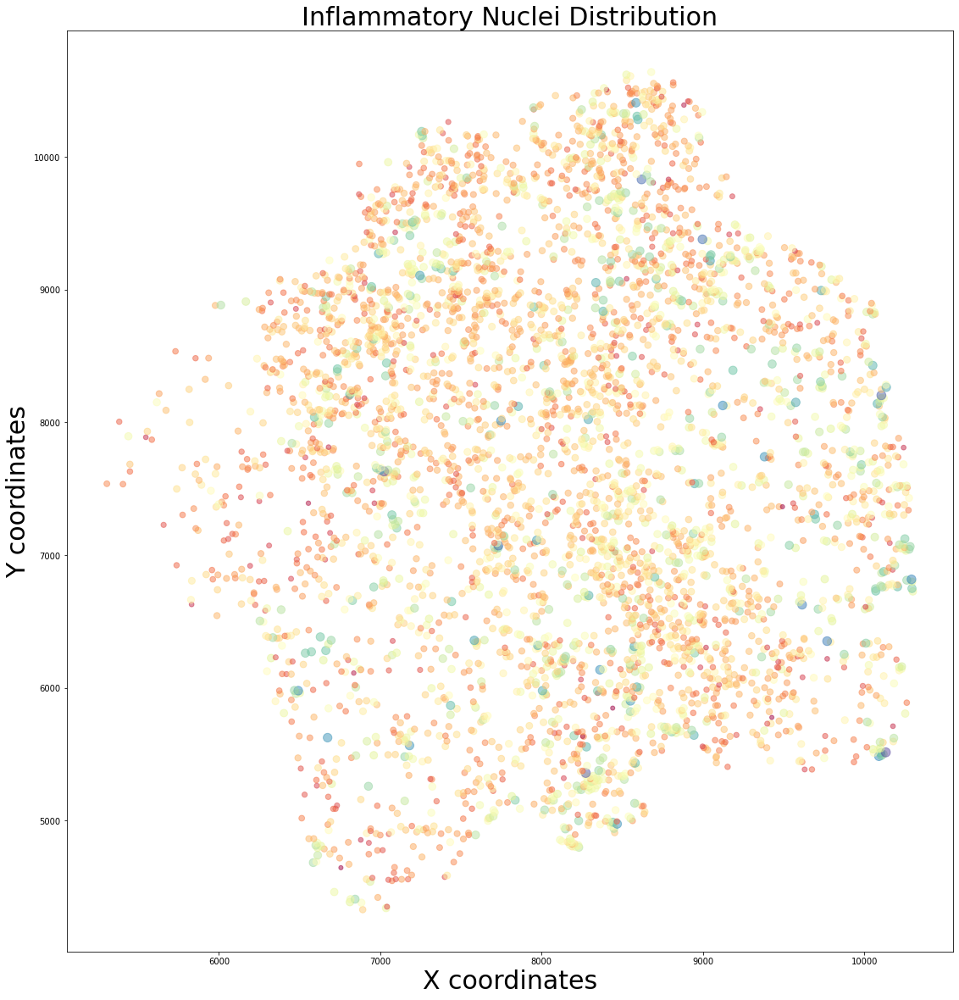

In [46]:
scatter_distribution_Inflammatory(dataframes_path, width, height)

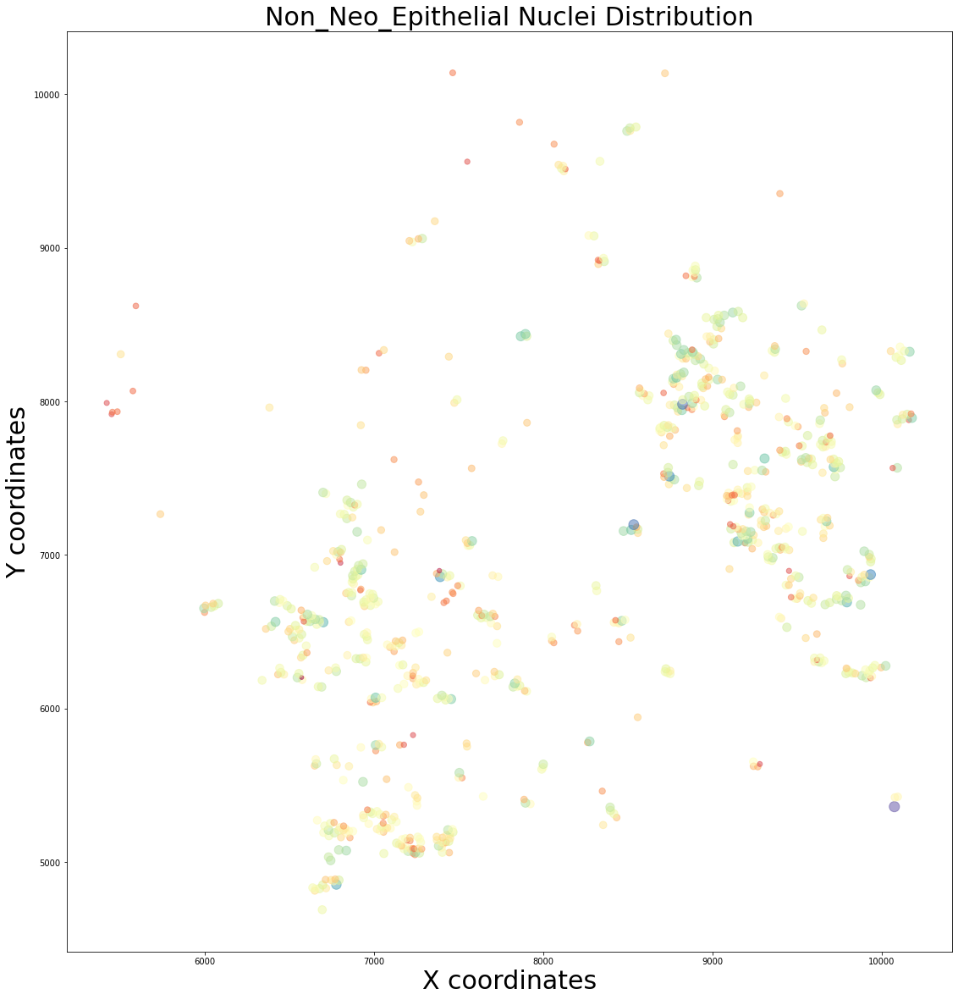

In [47]:
scatter_distribution_Non_Neo_Epithelial(dataframes_path, width, height)